### В данном блокноте я пытался оценить корректность признаков и отработать пути очистки от выбросов, а так же генерацию фич.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import seaborn as sns

%config InlineBackend.figure_format = 'svg'
%matplotlib inline
TRAIN_PATH = './train.csv'
TEST_PATH = './test.csv'
SUBMISSION_PATH = './sample_submission.csv'

import warnings
warnings.filterwarnings('ignore')

**Описание датасета**

* **Id** - идентификационный номер квартиры
* **DistrictId** - идентификационный номер района
* **Rooms** - количество комнат
* **Square** - площадь
* **LifeSquare** - жилая площадь
* **KitchenSquare** - площадь кухни
* **Floor** - этаж
* **HouseFloor** - количество этажей в доме
* **HouseYear** - год постройки дома
* **Ecology_1, Ecology_2, Ecology_3** - экологические показатели местности
* **Social_1, Social_2, Social_3** - социальные показатели местности
* **Healthcare_1, Helthcare_2** - показатели местности, связанные с охраной здоровья
* **Shops_1, Shops_2** - показатели, связанные с наличием магазинов, торговых центров
* **Price** - цена квартиры

In [2]:
tr = pd.read_csv(TRAIN_PATH)
te = pd.read_csv(TEST_PATH)

In [3]:
# te[te.LifeSquare > 200]

In [4]:
# tr[tr.LifeSquare > 200]

## Для того, чтобы не загромождать блокнот, часть ячеек уже выброшена. Самое важное осталось

# 1 - EDA, очистка

### 1.0 - Жилая в 4 раза больше общей и имеет большое значение

In [5]:
tr[tr.LifeSquare / 4 > tr.Square]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
357,14990,23,2.0,48.449873,263.542020,5.0,6,5.0,1972,0.075779,B,B,6,1437,3,NaN,0,2,B,141780.231857
5183,15886,85,3.0,78.059331,461.463614,10.0,12,16.0,1998,0.037178,B,B,52,11217,1,2300.0,1,7,B,394253.299978
5712,8961,27,1.0,33.398983,164.153360,6.0,3,5.0,1965,0.211401,B,B,9,1892,0,NaN,0,1,B,104891.073757
7033,1748,88,2.0,5.497061,67.628717,1.0,24,22.0,1977,0.127376,B,B,43,8429,3,NaN,3,9,B,412511.088764
8000,16550,27,3.0,81.694417,7480.592129,1.0,9,17.0,2016,0.017647,B,B,2,469,0,NaN,0,0,B,217357.492366
8805,10527,27,1.0,4.380726,40.805837,1.0,10,17.0,2013,0.211401,B,B,9,1892,0,NaN,0,1,B,97560.720383
9067,13265,1,3.0,4.823679,79.767964,0.0,6,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,237716.681261


Тут можно прийти к выводу, что жилая площадь иногда завышена в 10 или 100 раз. Попробуем отобрать именно эти строки

In [6]:
tr[(tr.LifeSquare / 4 > tr.Square) & (tr.LifeSquare > 150)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
357,14990,23,2.0,48.449873,263.542020,5.0,6,5.0,1972,0.075779,B,B,6,1437,3,NaN,0,2,B,141780.231857
5183,15886,85,3.0,78.059331,461.463614,10.0,12,16.0,1998,0.037178,B,B,52,11217,1,2300.0,1,7,B,394253.299978
5712,8961,27,1.0,33.398983,164.153360,6.0,3,5.0,1965,0.211401,B,B,9,1892,0,NaN,0,1,B,104891.073757
8000,16550,27,3.0,81.694417,7480.592129,1.0,9,17.0,2016,0.017647,B,B,2,469,0,NaN,0,0,B,217357.492366


In [7]:
te[(te.LifeSquare / 4 > te.Square) & (te.LifeSquare > 150)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
3798,11533,94,2.0,48.713443,303.071094,6.0,5,12.0,1974,0.521867,B,B,25,6149,0,NaN,0,0,B


Что на трейне, что на тесте. По вышеуказанному условию можно отобрать серьезные выбросы по значению жилой площади.
Выход - корректировка с помощью следующей функции

In [8]:
def correct_ls_1(X):
    df = X
    bls = (df.LifeSquare / 4 > df.Square) & (df.LifeSquare > 150)
    while bls.sum():
        df.loc[bls, 'LifeSquare'] = df.loc[bls, 'LifeSquare'] / 10
        bls = (df.LifeSquare / 4 > df.Square) & (df.LifeSquare > 150)
    return df

In [9]:
tr = correct_ls_1(tr)
tr[(tr.LifeSquare / 4 > tr.Square) & (tr.LifeSquare > 150)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price


In [10]:
te = correct_ls_1(te)
te[(te.LifeSquare / 2 > te.Square) & (te.LifeSquare > 150)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2


Как видим - данная проблема нас больше не беспокоит

### 1.1 - Общая больше 300

In [11]:
df = tr
bsq = (df.Square > 300) | (df.LifeSquare > 300)
df[bsq]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
726,28,9,2.0,604.705972,NaN,1.0,17,18.0,1977,0.161532,B,B,25,5648,1,30.0,2,4,B,187717.242538
7010,2307,102,1.0,409.425181,410.639749,10.0,4,4.0,2016,0.238617,B,B,26,3889,6,705.0,3,6,B,90470.430830
9229,11602,30,2.0,641.065193,638.163193,10.0,20,19.0,2019,0.000078,B,B,22,6398,141,1046.0,3,23,B,133529.681562


In [12]:
df = te
bsq = (df.Square > 300) | (df.LifeSquare > 300)
df[bsq]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2


Так же можно отметить, что общая площадь в случае превышения 300 - выбросы. И снова завышена кратно 10. Сделаем функцию

In [13]:
def correct_sq_1(X):
    df = X
    bsq = (df.Square > 300)
    df.loc[bsq, ['Square']] = df.loc[bsq, ['Square']] / 10
    return df

### 1.2 - Жилая больше 300

В случае с жилой больше 300 так же видно кратное превышение

In [14]:
def correct_ls_2(X):
    df = X
    bsq = (df.LifeSquare > 300)
    df.loc[bsq, ['LifeSquare']] = df.loc[bsq, ['LifeSquare']] / 10
    return df

Избавимся от кратных выбросов

In [15]:
tr = correct_sq_1(tr)
te = correct_sq_1(te)
tr = correct_ls_2(tr)
te = correct_ls_2(te)

### 1.3 - Жилая больше общей

In [16]:
df = tr

In [17]:
df = tr
df[df.LifeSquare > df.Square]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
33,847,74,2.0,73.314975,74.131261,1.0,7,6.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B,254005.381863
64,3992,1,3.0,87.200625,87.730225,0.0,21,22.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,300180.365669
77,11771,45,1.0,38.467276,39.624493,1.0,11,9.0,1977,0.195781,B,B,23,5212,6,NaN,3,2,B,247440.530601
100,13343,74,2.0,79.937665,82.931595,1.0,8,21.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B,226808.747168
111,13875,20,1.0,28.438794,32.514021,6.0,6,10.0,2014,0.019509,B,B,37,7687,11,176.0,5,5,B,199248.114376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9960,16258,48,3.0,96.056784,98.152802,1.0,15,1.0,2017,0.041125,B,B,46,9515,5,NaN,1,10,B,524365.550705
9962,14175,14,1.0,42.029175,44.682167,10.0,4,4.0,2018,0.238617,B,B,26,3889,6,705.0,3,6,B,87556.385617
9979,2201,6,1.0,40.043234,41.984322,1.0,3,17.0,2014,0.243205,B,B,5,1564,0,540.0,0,0,B,134888.083598
9987,11665,1,2.0,62.690057,64.602939,10.0,19,22.0,2018,0.007122,B,B,1,264,0,NaN,0,1,B,203908.192698


In [18]:
df = te
df[df.LifeSquare > df.Square]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
1,5925,62,1.0,42.493907,42.568133,10.0,7,17.0,2017,0.072158,B,B,2,629,1,NaN,0,0,A
25,14686,1,3.0,77.229885,79.958685,1.0,18,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B
28,10869,23,3.0,78.001888,82.566322,1.0,21,25.0,2015,0.075779,B,B,6,1437,3,NaN,0,2,B
39,16384,1,2.0,52.773671,52.910722,10.0,6,17.0,2017,0.007122,B,B,1,264,0,NaN,0,1,B
48,15509,27,2.0,55.439861,57.527243,10.0,15,17.0,2016,0.011654,B,B,4,915,0,NaN,0,0,B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4898,15984,23,3.0,104.786355,106.730272,1.0,14,25.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B
4945,9888,45,2.0,60.501260,60.881119,10.0,24,24.0,2016,0.195781,B,B,23,5212,6,NaN,3,2,B
4970,13494,169,1.0,47.012027,47.372332,8.0,4,17.0,2019,0.178917,B,B,18,3594,4,192.0,1,5,B
4979,4821,74,2.0,82.542507,82.585069,0.0,4,17.0,2015,0.309479,B,B,35,7715,4,990.0,0,6,B


Сверху локализованы строки, где жилая превышает общую площадь. Незначительно, но все же поменяем их местами.

In [19]:
def swap_sq_lsq(X):
    df = X
    swap_mask = df.LifeSquare > df.Square
    df.loc[swap_mask, ['Square', 'LifeSquare']] = df.loc[swap_mask, ['LifeSquare', 'Square']].values
    return df

In [20]:
df = tr
df = swap_sq_lsq(df)
df[df.LifeSquare > df.Square]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price


In [21]:
df = te
df = swap_sq_lsq(df)
df[df.LifeSquare > df.Square]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2


In [22]:
# tr[tr.Square < 12].sort_values(by='Price', ascending=False)

In [23]:
# te[te.Square < 12]

In [24]:
# df = tr
# df.Rooms.describe()

<AxesSubplot:>

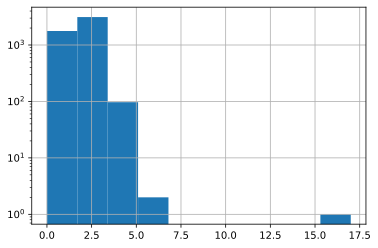

In [25]:
df.Rooms.hist(bins=10, log=True)

### 1.4 - статистика по средней площади на количество комнат + обнуление завышенных результатов

Первым делом - обнулим завышенные показатели

In [26]:
df = tr
df.loc[df.Rooms > 5, 'Rooms'] = 0
df = te
df.loc[df.Rooms > 5, 'Rooms'] = 0

для того, чтобы восстановить правильные значения - соберем статитсику по средней площади для квартир на основании количества комнат в них

In [27]:
def calc_sq_room_stat(X):
    df = X
    norm_rooms = (df.Rooms > 0)
    sq_room_stat = df[norm_rooms].groupby(by='Rooms')['Square'].mean().values
    return sq_room_stat

In [28]:
square_room_stat = calc_sq_room_stat(tr)
square_room_stat

array([ 41.32885188,  56.58026422,  77.00745863,  98.45365509,
       122.61494139])

In [29]:
df = tr
df[df.Square < 12]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
161,6782,45,1.0,5.257278,2.954309,1.0,3,1.0,1977,0.195781,B,B,23,5212,6,NaN,3,2,B,438005.182323
328,4504,27,3.0,5.610772,4.390331,1.0,8,19.0,2016,0.211401,B,B,9,1892,0,NaN,0,1,B,161379.067034
1401,9487,5,1.0,5.549458,5.129222,1.0,1,1.0,1977,0.150818,B,B,16,3433,4,2643.0,4,5,B,369472.403061
4496,15744,34,1.0,2.642219,1.988943,1.0,21,4.0,1977,0.069753,B,B,53,13670,4,NaN,1,11,B,458378.777006
4800,7657,38,1.0,4.618547,4.502784,1.0,28,1.0,1977,0.060753,B,B,15,2787,2,520.0,0,7,B,483283.488083
5009,11526,27,1.0,4.633498,1.969969,1.0,18,1.0,1977,0.011654,B,B,4,915,0,NaN,0,0,B,107604.269441
7470,14786,1,1.0,4.525736,1.136859,1.0,3,1.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,181434.825589
8572,10202,6,1.0,4.604943,2.596351,1.0,3,25.0,2014,0.243205,B,B,5,1564,0,540.0,0,0,B,137597.601458
9869,3224,27,0.0,2.377248,0.873147,0.0,1,0.0,1977,0.017647,B,B,2,469,0,NaN,0,0,B,126596.941798


Так же у нас имеется некоторое количество квартир с сильно заниженной общей площадью

### 1.5 - средняя площадь квартиры на рынке

Заменим крайне низкие общие площади средней по рынку

In [30]:
def get_mean_sq(X):
    df = tr
    min_sq = (df.Square < 12)
    mean = df.Square[~min_sq].mean()
    return mean

In [31]:
mean_square = get_mean_sq(tr)
mean_square

56.30828750351224

### 1.6 - восстановление площади для самых маленьких (<12м)

In [32]:
def restore_min_square(X, mean_sq):
    df = X
    min_sq = (df.Square < 12)
    df.loc[min_sq, 'Square'] = mean_sq
    return df

In [33]:
df = tr
df = restore_min_square(df, mean_square)
df[df.Square < 12]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price


In [34]:
df = te
df = restore_min_square(df, mean_square)
df[df.Square < 12]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2


### 1.7 - восстановление числа комнат

In [35]:
df = tr
df[df.Rooms == 0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
2004,5927,57,0.0,59.056975,36.223072,10.0,22,22.0,2002,0.090799,B,B,74,19083,2,NaN,5,15,B,317265.323792
2194,3159,88,0.0,38.697117,19.345131,9.0,9,16.0,1982,0.127376,B,B,43,8429,3,NaN,3,9,B,158998.110646
2728,14865,9,0.0,60.871266,38.420681,10.0,3,2.0,1994,0.161532,B,B,25,5648,1,30.0,2,4,B,172329.270863
3780,7317,27,0.0,41.790881,NaN,0.0,13,0.0,1977,0.211401,B,B,9,1892,0,NaN,0,1,B,98129.976788
5894,770,28,0.0,49.483501,NaN,0.0,16,0.0,2015,0.118537,B,B,30,6207,1,1183.0,1,0,B,217009.338463
6088,8491,1,0.0,42.006046,21.779288,7.0,17,17.0,2014,0.007122,B,B,1,264,0,NaN,0,1,B,78364.616704
6401,9443,27,0.0,87.762616,85.125471,0.0,5,15.0,1977,0.211401,B,B,9,1892,0,NaN,0,1,B,219281.918007
7644,7917,27,0.0,212.932361,211.231125,0.0,2,3.0,2008,0.211401,B,B,9,1892,0,NaN,0,1,B,302211.260887
7929,456,6,0.0,81.491446,NaN,0.0,4,0.0,1977,0.243205,B,B,5,1564,0,540.0,0,0,B,212864.799112
8794,14003,99,0.0,59.414334,38.702244,6.0,7,9.0,1969,0.033494,B,B,66,10573,1,1322.0,3,8,B,229661.964416


На основании известной площади мы можем сделать вывод о количестве комнат

In [36]:
def restore_rooms(sq):
    stat = square_room_stat.copy()
    stat -= sq
    stat = np.abs(stat)
    index = int(np.argmin(stat))
    return index + 1

In [37]:
restore_rooms(49)

2

In [38]:
df = tr
null_rooms = (df.Rooms == 0)
df.loc[null_rooms, 'Rooms'] = df.loc[null_rooms, 'Square'].apply(restore_rooms)
df[df.Rooms == 0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price


In [39]:
df = te
null_rooms = (df.Rooms == 0)
df.loc[null_rooms, 'Rooms'] = df.loc[null_rooms, 'Square'].apply(restore_rooms)
df[df.Rooms == 0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2


In [40]:
tr.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.889000,56.308288,35.919336,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.812739,19.081547,17.648759,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,1.000000,15.988889,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.882259,22.761965,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.677576,32.756199,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.983195,45.020673,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,5.000000,275.645284,233.949309,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


### 1.8 - сбор статистики, восстановление и корректировка размера кухни 

In [41]:
df = tr
ls_notna = ~df.LifeSquare.isna()
df[ls_notna].head()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
1,3013,22,1.0,39.832524,23.169223,8.0,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.553407
2,8215,1,3.0,78.342215,47.671972,10.0,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.720850
4,13866,94,2.0,64.285067,38.562517,9.0,16,16.0,1972,0.282798,B,B,33,8667,2,NaN,0,6,B,343995.102962
5,5804,99,3.0,62.528465,47.103833,6.0,9,9.0,1972,0.012339,B,B,35,5776,1,2078.0,2,4,B,161044.944138
6,8864,44,1.0,33.938750,21.772930,9.0,1,12.0,1968,0.232205,B,B,24,4860,1,80.0,0,3,B,142402.739272


условимся, что нормальный размер кухни более 5 квадратных метров

In [42]:
norm_ksq = ((df.KitchenSquare >= 4) & (df.KitchenSquare < 35))
df[norm_ksq]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,11809,27,3.0,115.027311,NaN,10.0,4,10.0,2014,0.075424,B,B,11,3097,0,NaN,0,0,B,305018.871089
1,3013,22,1.0,39.832524,23.169223,8.0,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.553407
2,8215,1,3.0,78.342215,47.671972,10.0,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.720850
4,13866,94,2.0,64.285067,38.562517,9.0,16,16.0,1972,0.282798,B,B,33,8667,2,NaN,0,6,B,343995.102962
5,5804,99,3.0,62.528465,47.103833,6.0,9,9.0,1972,0.012339,B,B,35,5776,1,2078.0,2,4,B,161044.944138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1260,61,2.0,49.090728,33.272626,6.0,3,12.0,1981,0.300323,B,B,52,10311,6,NaN,1,9,B,119367.455796
9996,16265,27,2.0,64.307684,37.038420,9.0,13,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,199715.148807
9997,2795,178,1.0,29.648057,16.555363,5.0,3,5.0,1958,0.460556,B,B,20,4386,14,NaN,1,5,B,165953.912580
9998,14561,21,1.0,32.330292,22.326870,5.0,3,9.0,1969,0.194489,B,B,47,8004,3,125.0,3,5,B,171842.411855


In [43]:
# df[ls_notna & norm_ksq]

In [44]:
df_nsq = df[norm_ksq]

In [45]:
# df_nsq.KitchenSquare.sort_values(ascending=False)

In [46]:
# df_nsq.KitchenSquare.median()

In [47]:
# df_nsq.KitchenSquare.hist(bins = 20, log=True)тати

In [48]:
# df_nsq.loc[df_nsq.KitchenSquare > 20]

In [49]:
# df_nsq.groupby(by='Rooms', as_index=False).agg({'KitchenSquare':'median'})

In [50]:
# df_nsq.KitchenSquare.quantile()

In [51]:
# for i in range(1, 6):
#     q_025 = df_nsq.loc[df_nsq.Rooms == i, 'KitchenSquare'].quantile(q=0.025)
#     median = df_nsq.loc[df_nsq.Rooms == i, 'KitchenSquare'].mean()
#     q_975 = df_nsq.loc[df_nsq.Rooms == i, 'KitchenSquare'].quantile(q=0.975)
#     print(f"rooms - {i}; q_025 - {q_025}; median - {median}; q_975 - {q_975}")

соберем статистику по среднему размеру кухни для разлиных по числу комнат квартир

In [52]:
def get_kitchen_stat(X):
    df = X
    norm_ksq = ((df.KitchenSquare >= 4) & (df.KitchenSquare < 35))
    df_nsq = df[norm_ksq]
    kitchen_stat = []
    for i in range(1, 6):
        kitchen_stat_line = []
        kitchen_stat_line.append(df_nsq.loc[df_nsq.Rooms == i, 'KitchenSquare'].quantile(q=0.025))
        kitchen_stat_line.append(df_nsq.loc[df_nsq.Rooms == i, 'KitchenSquare'].mean())
        kitchen_stat_line.append(df_nsq.loc[df_nsq.Rooms == i, 'KitchenSquare'].quantile(q=0.975))
        kitchen_stat.append(kitchen_stat_line)
    return kitchen_stat

In [53]:
df = tr
kitchen_stat = get_kitchen_stat(tr)
kitchen_stat

[[5.0, 7.909790508764429, 13.0],
 [5.0, 7.636192626034613, 13.0],
 [5.0, 8.588557516737675, 14.0],
 [5.0, 9.684615384615384, 22.324999999999974],
 [5.0, 11.714285714285714, 28.699999999999996]]

In [54]:
# small_kitchen = (df.KitchenSquare < 4)
# df[small_kitchen].head()

In [55]:
# big_kitchen = (df.KitchenSquare > 29)
# df[big_kitchen].head()

реализуем функцию для корректировки размера кухни

In [56]:
def restore_kitchen_size(X):
    df = X
    for n_rooms in range(1, 6):
        min_sq, med_sq, max_sq = kitchen_stat[n_rooms - 1]
        very_small_kitchen = (df.KitchenSquare < min_sq)
        df.loc[(very_small_kitchen) & (df.Rooms == n_rooms), 'KitchenSquare'] = med_sq
        very_big_kitchen = (df.KitchenSquare > max_sq)
        df.loc[(very_big_kitchen) & (df.Rooms == n_rooms), 'KitchenSquare'] = med_sq

In [57]:
df = tr
restore_kitchen_size(df)
df.iloc[[3, 286]]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
3,2352,1,1.0,40.409907,NaN,7.909791,10,22.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,168106.007630
286,2737,27,3.0,125.806981,123.430072,8.588558,5,10.0,2015,0.017647,B,B,2,469,0,NaN,0,0,B,234194.837047


In [58]:
df = te
restore_kitchen_size(te)

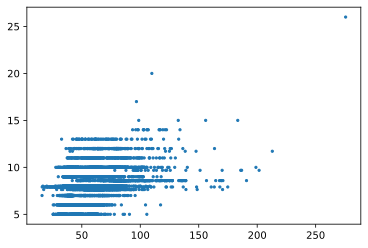

In [59]:
plt.scatter(tr.Square, tr.KitchenSquare, s=5)
plt.show()

In [60]:
df = tr.sort_values(by='Square')
# df.head()

In [61]:
df = df.reset_index(drop=True)
# df.head()

In [62]:
# plt.rcParams['figure.figsize'] = 12, 8
# plt.plot(df.Square.values, label='Square')
# plt.plot(df.LifeSquare.values, label='LifeSquare')
# plt.plot(df.KitchenSquare.values, label='KitchenSquare')
# plt.legend()

попытаемся найти квартиры с неверными данными о жилой площади

In [63]:
# если не указано
ls_na = df.LifeSquare.isna()
# если подозрительно велика
ls_big = df.LifeSquare > (df.Square - df.KitchenSquare - 2.5)
# подозрительно мала
ls_small = (df.Square / df.LifeSquare) > 2
# общая маска
ls_bad = ls_na | ls_big | ls_small

In [64]:
df.loc[ls_bad]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,12676,81,3.0,15.988889,13.784865,7.000000,4,5.0,1960,0.319809,B,B,25,4756,16,2857.0,5,8,B,78388.806186
1,6927,21,1.0,16.117154,8.822988,7.909791,2,5.0,1965,0.194489,B,B,47,8004,3,125.0,3,5,B,79913.267856
2,15877,57,3.0,16.698571,16.547242,8.000000,5,5.0,1962,0.133215,B,B,49,11395,3,1406.0,3,4,A,77835.185808
3,12927,62,2.0,17.414181,NaN,7.636193,4,20.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,180750.471749
4,13685,0,1.0,17.498542,13.446544,7.909791,7,5.0,1961,0.319809,B,B,25,4756,16,2857.0,5,8,B,88871.750230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,11055,151,1.0,174.837082,174.649522,7.909791,10,12.0,1958,0.236108,B,B,16,3893,27,NaN,3,10,B,232766.187698
9993,15947,129,4.0,185.906396,84.830074,9.684615,5,3.0,2015,0.020741,B,B,24,5613,5,1340.0,2,5,B,340273.238253
9994,3233,129,4.0,186.692602,87.487080,9.684615,3,3.0,2011,0.020741,B,B,24,5613,5,1340.0,2,5,B,423443.464367
9997,16568,27,4.0,201.627361,200.334539,9.684615,1,2.0,2013,0.041116,B,B,53,14892,4,NaN,1,4,B,528560.506016


In [65]:
# df = df.loc[~ls_bad]
# plt.rcParams['figure.figsize'] = 10, 4
# # plt.plot(df.Square.values, label='Square')
# # plt.plot(df.LifeSquare.values, label='LifeSquare')
# # plt.plot(df.KitchenSquare.values, label='KitchenSquare')
# plt.plot( df.Square.values / (df.Square.values - df.LifeSquare.values - df.KitchenSquare.values))
# plt.legend()

In [66]:
df_norm_ls = df.loc[~ls_bad]
te.Square.min()

13.30553146594922

получить размер жилой площади реально и мы на данном этапе уже подготовили размер кухни и общую площадь. осталось прикинуть сколько лишнего пространства остается в зависимости от площади

### 1.9 - Статистика лишнего пространства в квартирах на основе площади

In [67]:
def get_excess_stat(X):
    df = X
    ls_na = df.LifeSquare.isna()
    ls_big = df.LifeSquare > (df.Square - df.KitchenSquare - 2.5)
    ls_small = (df.Square / df.LifeSquare) > 2
    ls_bad = ls_na | ls_big | ls_small
    df_norm_ls = df.loc[~ls_bad]
#     print(df_norm_ls.shape[0])
    ranges = [120, 110, 100, 90, 85, 80, 75, 70, 65, 60, 55, 50, 45, 40, 30, 10]
    excess_stat = []
    mask = df.Square.isna() # 00000000
#     print(mask.sum())
    for curr_range in ranges:
        excess = []
        excess.append(curr_range)
        curr_mask = df_norm_ls.Square >= curr_range
        curr_mask = curr_mask ^ mask
        mean_ex = (df_norm_ls.loc[curr_mask, 'Square'] / (df_norm_ls.loc[curr_mask, 'Square'] - \
                   (df_norm_ls.loc[curr_mask, 'LifeSquare'] + df_norm_ls.loc[curr_mask, 'KitchenSquare']))).mean()
        excess.append(mean_ex)
        excess_stat.append(excess)
        mask = mask | curr_mask
#         print(f"{curr_range} {curr_mask.sum()} {mask.sum()}")
    return excess_stat

In [68]:
excess_stat = get_excess_stat(tr)

In [69]:
tr.loc[tr.Square > 100]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,11809,27,3.0,115.027311,NaN,10.000000,4,10.0,2014,0.075424,B,B,11,3097,0,NaN,0,0,B,305018.871089
32,3876,100,4.0,104.769022,79.316650,8.000000,4,8.0,1960,0.200147,B,B,23,3975,8,770.0,2,0,B,600903.828562
116,5594,23,3.0,105.479256,NaN,8.588558,16,25.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B,245260.231007
123,739,84,4.0,102.522270,74.513462,9.000000,4,5.0,1961,0.149666,B,B,22,4789,2,4087.0,4,1,B,415574.115819
136,5284,27,4.0,119.914990,78.518874,13.000000,8,12.0,2015,0.072158,B,B,2,629,1,NaN,0,0,A,221374.057293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9846,1205,23,2.0,148.671938,100.201652,7.636193,1,3.0,2013,0.014073,B,B,2,475,0,NaN,0,0,B,152464.848743
9851,12142,74,3.0,116.494390,115.110477,8.588558,3,17.0,2018,0.309479,B,B,35,7715,4,990.0,0,6,B,404355.847831
9877,11391,62,3.0,122.181937,NaN,8.588558,3,3.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,259991.137225
9937,6149,53,4.0,109.905861,94.268671,20.000000,12,24.0,2018,0.049637,B,B,34,7759,0,229.0,1,3,B,492943.252891


In [70]:
excess_stat

[[120, 3.883714734034871],
 [110, 3.899511647437592],
 [100, 4.177975884931843],
 [90, 3.8910653420687153],
 [85, 3.7686616885521955],
 [80, 3.673540386332926],
 [75, 3.9859783846341754],
 [70, 4.205669455847214],
 [65, 4.4747460593442545],
 [60, 4.696605981227688],
 [55, 4.4332951315999285],
 [50, 4.593426958296085],
 [45, 4.5508576240109875],
 [40, 4.4776865743919005],
 [30, 5.018984718992416],
 [10, 5.898153820465665]]

In [71]:
def square_to_excess_square(sq):
    if sq > excess_stat[0][0]:
        return sq / excess_stat[0][1]
    i = 0
    while sq > excess_stat[i][0]:
        i += 1
    return sq / excess_stat[i][1]
    

In [72]:
square_to_excess_square(144.5)

37.20664618687789

In [73]:
tr[ls_bad]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,11809,27,3.0,115.027311,NaN,10.000000,4,10.0,2014,0.075424,B,B,11,3097,0,NaN,0,0,B,305018.871089
1,3013,22,1.0,39.832524,23.169223,8.000000,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.553407
2,8215,1,3.0,78.342215,47.671972,10.000000,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.720850
3,2352,1,1.0,40.409907,NaN,7.909791,10,22.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,168106.007630
4,13866,94,2.0,64.285067,38.562517,9.000000,16,16.0,1972,0.282798,B,B,33,8667,2,NaN,0,6,B,343995.102962
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,11173,6,2.0,62.648779,NaN,7.636193,6,17.0,1977,0.243205,B,B,5,1564,0,540.0,0,0,B,182625.548872
9993,9289,1,3.0,88.931509,84.486078,8.588558,4,22.0,2016,0.007122,B,B,1,264,0,NaN,0,1,B,264213.558631
9994,4356,9,1.0,43.303458,21.519087,8.000000,12,14.0,1992,0.161532,B,B,25,5648,1,30.0,2,4,B,136744.340827
9997,2795,178,1.0,29.648057,16.555363,5.000000,3,5.0,1958,0.460556,B,B,20,4386,14,NaN,1,5,B,165953.912580


корректировка размера жилой площади

In [74]:
def correct_ls_3(X):
    df = X
    ls_na = df.LifeSquare.isna()
    ls_big = df.LifeSquare > (df.Square - df.KitchenSquare - 2.5)
    ls_small = (df.Square / df.LifeSquare) > 2
    ls_bad = ls_na | ls_big | ls_small
    df.loc[ls_bad, 'LifeSquare'] = df.loc[ls_bad, 'Square'] - df.loc[ls_bad, 'KitchenSquare'] - \
                                   df.loc[ls_bad, 'Square'].apply(square_to_excess_square)
    return df

In [75]:
tr = correct_ls_3(tr)
te = correct_ls_3(te)

In [76]:
# tr.iloc[0]

In [77]:
# df = tr.sort_values(by="Square")
# plt.rcParams['figure.figsize'] = 10, 4
# plt.plot(df.Square.values, label='Square')
# plt.plot(df.LifeSquare.values, label='LifeSquare')
# plt.plot(df.KitchenSquare.values, label='KitchenSquare')
# # plt.plot( df.Square.values / (df.Square.values - df.LifeSquare.values - df.KitchenSquare.values))
# plt.legend()

### 1.10 - Этажи и год постройки

In [78]:
tr.HouseFloor.describe()

count    10000.000000
mean        12.609400
std          6.775974
min          0.000000
25%          9.000000
50%         13.000000
75%         17.000000
max        117.000000
Name: HouseFloor, dtype: float64

In [79]:
df = tr

In [80]:
df[df.HouseFloor > 40]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
646,5279,93,2.0,60.804544,30.923827,11.000000,5,45.0,2016,0.050900,B,B,43,10621,1,30.0,2,3,B,213171.135199
746,9300,74,2.0,74.579809,46.376594,9.000000,5,99.0,1977,0.075779,B,B,6,1437,3,NaN,0,2,B,243329.912579
765,6589,30,1.0,62.110823,38.208400,7.909791,31,44.0,2009,0.000078,B,B,22,6398,141,1046.0,3,23,B,117647.461002
1678,78,30,2.0,66.811789,41.972534,7.636193,8,117.0,1977,0.000078,B,B,22,6398,141,1046.0,3,23,B,207248.370520
4657,10806,5,1.0,51.944587,30.659822,7.909791,6,99.0,1977,0.150818,B,B,16,3433,4,2643.0,4,5,B,296127.115515
4987,1674,76,2.0,74.344672,41.044132,5.000000,42,48.0,2016,0.000000,B,B,7,1660,39,1786.0,1,5,B,411691.504766
5031,7453,24,3.0,126.621358,82.018202,12.000000,22,48.0,2011,0.111627,B,B,50,12238,8,1970.0,2,3,B,179396.521035
5259,6502,20,1.0,126.389517,103.637322,7.909791,22,47.0,2012,0.019509,B,B,37,7687,11,176.0,5,5,B,450706.552655


In [81]:
df = te

то, что боольше 50 - бред

In [82]:
def correct_house_floor_1(X):
    df = X
    df.loc[df.HouseFloor > 50, 'HouseFloor'] = round(df.loc[df.HouseFloor > 50, 'HouseFloor'] / 10)
    return df

In [83]:
df = tr
df = correct_house_floor_1(df)
# df[df.HouseFloor > 40]

In [84]:
df = te
df = correct_house_floor_1(df)
# df[df.HouseFloor > 40]

In [85]:
df = tr
# df[df.HouseFloor == 0]

In [86]:
df = tr
# df[df.Floor > df.HouseFloor]

In [87]:
tr.HouseYear.max(), te.HouseYear.max()

(20052011, 2020)

In [88]:
tr.HouseYear.min(), te.HouseYear.min()

(1910, 1908)

In [89]:
tr.HouseYear.mode()

0    1977
dtype: int64

выбросы по году постройки заменим на моду

In [90]:
df = tr
hy_mode = df.HouseYear.mode().values[0]
hy_mode

1977

In [91]:
def correct_house_year_1(X):
    df = X
    bad_hy = (df.HouseYear < 1900) | (df.HouseYear > 2021)
    df.loc[bad_hy, 'HouseYear'] = hy_mode
    return df

In [92]:
tr = correct_house_year_1(tr)
te = correct_house_year_1(te)

In [93]:
tr.HouseYear.min(), te.HouseYear.max()

(1910, 2020)

In [94]:
tr.HouseYear.min(), te.HouseYear.min()

(1910, 1908)

In [95]:
df = tr
norm_hfloor = (df.HouseFloor >= df.Floor) & (df.HouseFloor != 0)
df[norm_hfloor]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
0,11809,27,3.0,115.027311,75.409453,10.000000,4,10.0,2014,0.075424,B,B,11,3097,0,NaN,0,0,B,305018.871089
1,3013,22,1.0,39.832524,23.169223,8.000000,7,8.0,1966,0.118537,B,B,30,6207,1,1183.0,1,0,B,177734.553407
2,8215,1,3.0,78.342215,47.671972,10.000000,2,17.0,1988,0.025609,B,B,33,5261,0,240.0,3,1,B,282078.720850
3,2352,1,1.0,40.409907,22.095154,7.909791,10,22.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,168106.007630
4,13866,94,2.0,64.285067,38.562517,9.000000,16,16.0,1972,0.282798,B,B,33,8667,2,NaN,0,6,B,343995.102962
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,4356,9,1.0,43.303458,24.153448,8.000000,12,14.0,1992,0.161532,B,B,25,5648,1,30.0,2,4,B,136744.340827
9995,1260,61,2.0,49.090728,33.272626,6.000000,3,12.0,1981,0.300323,B,B,52,10311,6,NaN,1,9,B,119367.455796
9997,2795,178,1.0,29.648057,16.555363,5.000000,3,5.0,1958,0.460556,B,B,20,4386,14,NaN,1,5,B,165953.912580
9998,14561,21,1.0,32.330292,22.326870,5.000000,3,9.0,1969,0.194489,B,B,47,8004,3,125.0,3,5,B,171842.411855


In [96]:
def get_mode(s):
    return s.mode().values[0]

In [97]:
floor_mean = df[norm_hfloor]['HouseFloor'].mean()
floor_mean

14.008929663608562

соберем данные о высоте домов по году их постройки

In [98]:
def get_hfloor_stat(X):
    df = X
    norm_hfloor = (df.HouseFloor >= df.Floor) & (df.HouseFloor != 0)
    df['hy'] = np.floor(df['HouseYear'] / 10)
    floor_stat_modes = df.loc[norm_hfloor].groupby(by='hy')['HouseFloor'].apply(get_mode).to_dict()
    floor_stat_max = df.loc[norm_hfloor].groupby(by='hy')['HouseFloor'].max().to_dict()
    last_val = 4
    for key in range(190, 202):
        val = floor_stat_modes.get(key)
        if val is None:
            floor_stat_modes[key] = last_val
        else:
            last_val = val
    df.drop(columns='hy', axis=1, inplace=True)
    return floor_stat_modes, floor_stat_max

In [99]:
df = tr
floor_stat_modes, floor_stat_max = get_hfloor_stat(df)
floor_stat_modes, floor_stat_max

({191.0: 4.0,
  192.0: 5.0,
  193.0: 5.0,
  194.0: 7.0,
  195.0: 5.0,
  196.0: 5.0,
  197.0: 17.0,
  198.0: 16.0,
  199.0: 17.0,
  200.0: 17.0,
  201.0: 17.0,
  202.0: 24.0,
  190: 4},
 {191.0: 9.0,
  192.0: 8.0,
  193.0: 12.0,
  194.0: 10.0,
  195.0: 22.0,
  196.0: 25.0,
  197.0: 40.0,
  198.0: 25.0,
  199.0: 25.0,
  200.0: 44.0,
  201.0: 48.0,
  202.0: 24.0})

In [100]:
# df['hy']

In [101]:
def year_to_floor_modes(y):
    return floor_stat_modes.get(np.floor(y / 10))

In [102]:
def year_to_floor_max(y):
    return floor_stat_max.get(np.floor(y / 10))

восстановим выбросы по этажности

In [103]:
def correct_house_floor_2(X):
    df = X
    # если ноль - меняем на моду для данного года    
    bad_hfloor = (df.HouseFloor == 0)
    df.loc[bad_hfloor, 'HouseFloor'] = df.loc[bad_hfloor, 'HouseYear'].apply(year_to_floor_modes)
    # если выше крыши - на моду    
    bad_hfloor = (df.HouseFloor < df.Floor)
    df.loc[bad_hfloor, 'HouseFloor'] = df.loc[bad_hfloor, 'HouseYear'].apply(year_to_floor_modes)
    # если снова выше крыши - меняем на максимум    
    bad_hfloor = (df.HouseFloor < df.Floor)
    df.loc[bad_hfloor, 'HouseFloor'] = df.loc[bad_hfloor, 'HouseYear'].apply(year_to_floor_max)
    return df

In [104]:
df = tr
df = correct_house_floor_2(df)
bad_hfloor = (df.HouseFloor == 0) | (df.HouseFloor < df.Floor)
# df[bad_hfloor]

In [105]:
df = te
df = correct_house_floor_2(df)
bad_hfloor = (df.HouseFloor == 0) | (df.HouseFloor < df.Floor)
# df[bad_hfloor]

In [106]:
df = tr
bad_floor = (df.Floor > df.HouseFloor) | (df.Floor == 0)
# df[bad_floor]

In [107]:
df = te
bad_floor = (df.Floor > df.HouseFloor) | (df.Floor == 0)
# df[bad_floor]

теперь по этажу квартиры, если что-то не бьет - меняем на рандомный этаж данного дома

In [108]:
def correct_floor(X):
    df = X
    bad_floor = (df.Floor > df.HouseFloor) | (df.Floor == 0)
    df.loc[bad_floor, 'Floor'] = np.random.randint(1, df.loc[bad_floor, 'HouseFloor'])
    return df

In [109]:
df = tr
df = correct_floor(df)

In [110]:
df = te
df = correct_floor(df)

### 1.11 - Экология

In [111]:
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     10000 non-null  float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  object 
 11  Ecology_3      10000 non-null  object 
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

In [112]:
binary_to_numbers = {'A': 0, 'B': 1}

In [113]:
df = tr
df['Ecology_2'] = df['Ecology_2'].replace(binary_to_numbers)
df['Ecology_3'] = df['Ecology_3'].replace(binary_to_numbers)

In [114]:
df = te
df['Ecology_2'] = df['Ecology_2'].replace(binary_to_numbers)
df['Ecology_3'] = df['Ecology_3'].replace(binary_to_numbers)

In [115]:
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     10000 non-null  float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  int64  
 11  Ecology_3      10000 non-null  int64  
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

### 1.12 - Магазины

In [116]:
df = tr
df['Shops_2'] = df['Shops_2'].replace(binary_to_numbers)
df = te
df['Shops_2'] = df['Shops_2'].replace(binary_to_numbers)

### 1.13 - Медицина

есть пропуски - восстановим их с помощью других признаков

In [117]:
df = tr
df.Healthcare_1.describe()

count    5202.000000
mean     1142.904460
std      1021.517264
min         0.000000
25%       350.000000
50%       900.000000
75%      1548.000000
max      4849.000000
Name: Healthcare_1, dtype: float64

In [118]:
df.columns

Index(['Id', 'DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
       'Helthcare_2', 'Shops_1', 'Shops_2', 'Price'],
      dtype='object')

In [119]:
hc1_features = ['Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 
                        'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2']
hc1_features_1 = ['Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 
                          'Helthcare_2', 'Shops_1', 'Shops_2']

In [120]:
X = df[hc1_features]
X = X.loc[~X.Healthcare_1.isna()]
y = X['Healthcare_1']
X = X[hc1_features_1]

In [121]:
X.head()

,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Helthcare_2,Shops_1,Shops_2
1,0.118537,1,1,30,6207,1,1,0,1
2,0.025609,1,1,33,5261,0,3,1,1
5,0.012339,1,1,35,5776,1,2,4,1
6,0.232205,1,1,24,4860,1,0,3,1
7,0.019509,1,1,37,7687,11,5,5,1


In [122]:
from sklearn.model_selection import train_test_split
X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.25, random_state=42)
X_tr.shape, X_te.shape, y_tr.shape, y_te.shape

((3901, 9), (1301, 9), (3901,), (1301,))

In [123]:
from sklearn.metrics import r2_score as r2

In [124]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values, paint=0):
    print("Train R2:\t" + str(round(r2(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2(test_true_values, test_pred_values), 3)))
    
    if paint:
        plt.figure(figsize=(10,5))

        plt.subplot(121)
        sns.scatterplot(x=train_pred_values, y=train_true_values, size=3)
        plt.xlabel('Predicted values')
        plt.ylabel('True values')
        plt.title('Train sample prediction')

        plt.subplot(122)
        sns.scatterplot(x=test_pred_values, y=test_true_values, size=3)
        plt.xlabel('Predicted values')
        plt.ylabel('True values')
        plt.title('Test sample prediction')

        plt.show()

In [125]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae

In [126]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.tree import DecisionTreeRegressor, plot_tree

In [127]:
hc1_model = RandomForestRegressor(random_state=100, max_depth=7, max_features=4, n_estimators=200)
hc1_model.fit(X_tr, y_tr)
y_tr_pred = hc1_model.predict(X_tr)
y_te_pred = hc1_model.predict(X_te)
evaluate_preds(y_tr.values.flatten(), y_tr_pred.flatten(), y_te.values.flatten(), y_te_pred.flatten(), 1)

Train R2:	0.954
Test R2:	0.95


недостающие предскажем моделькой

In [128]:
tr.loc[tr.Healthcare_1.isna(), 'Healthcare_1'] = hc1_model.predict(tr.loc[tr.Healthcare_1.isna(), hc1_features_1])

In [129]:
tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     10000 non-null  float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  int64  
 11  Ecology_3      10000 non-null  int64  
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   10000 non-null  float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

In [130]:
te.loc[te.Healthcare_1.isna(), 'Healthcare_1'] = hc1_model.predict(te.loc[te.Healthcare_1.isna(), hc1_features_1])

In [131]:
te.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             5000 non-null   int64  
 1   DistrictId     5000 non-null   int64  
 2   Rooms          5000 non-null   float64
 3   Square         5000 non-null   float64
 4   LifeSquare     5000 non-null   float64
 5   KitchenSquare  5000 non-null   float64
 6   Floor          5000 non-null   int64  
 7   HouseFloor     5000 non-null   float64
 8   HouseYear      5000 non-null   int64  
 9   Ecology_1      5000 non-null   float64
 10  Ecology_2      5000 non-null   int64  
 11  Ecology_3      5000 non-null   int64  
 12  Social_1       5000 non-null   int64  
 13  Social_2       5000 non-null   int64  
 14  Social_3       5000 non-null   int64  
 15  Healthcare_1   5000 non-null   float64
 16  Helthcare_2    5000 non-null   int64  
 17  Shops_1        5000 non-null   int64  
 18  Shops_2 

### 2 - Генерация новых фич

#### 2.1 - Рейтинг районов(дороговизна квадратного метра)

In [132]:
df = tr
# df.head()

In [133]:
distr_rating = df.groupby(by='DistrictId', as_index=False).agg({'Price': 'sum', 'Square': 'sum'})
distr_rating.rename(columns={'Price': 'price_sum', 'Square': 'sqr_sum'}, inplace=True)
distr_rating.head()

,DistrictId,price_sum,sqr_sum
0,0,9.374188e+06,2618.394574
1,1,1.224491e+08,38807.686545
2,2,1.900771e+07,4204.249614
3,3,1.475221e+07,4111.345762
4,4,3.301064e+06,735.052445


In [134]:
distr_rating['sq_meter_price'] = distr_rating.price_sum / distr_rating.sqr_sum
distr_rating.head()

,DistrictId,price_sum,sqr_sum,sq_meter_price
0,0,9.374188e+06,2618.394574,3580.128227
1,1,1.224491e+08,38807.686545,3155.280122
2,2,1.900771e+07,4204.249614,4521.071292
3,3,1.475221e+07,4111.345762,3588.170925
4,4,3.301064e+06,735.052445,4490.922499


In [135]:
df = pd.merge(df, distr_rating[['DistrictId', 'sq_meter_price']], on='DistrictId', how='left')
tr = df
df.head(3)

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,sq_meter_price
0,11809,27,3.0,115.027311,75.409453,10.0,4,10.0,2014,0.075424,...,1,11,3097,0,669.15455,0,0,1,305018.871089,2697.457882
1,3013,22,1.0,39.832524,23.169223,8.0,7,8.0,1966,0.118537,...,1,30,6207,1,1183.00000,1,0,1,177734.553407,3652.102114
2,8215,1,3.0,78.342215,47.671972,10.0,2,17.0,1988,0.025609,...,1,33,5261,0,240.00000,3,1,1,282078.720850,3155.280122


In [136]:
df.sq_meter_price.describe()

count    10000.000000
mean      3823.350549
std        948.573450
min       2219.859577
25%       2953.337431
50%       4050.683932
75%       4362.983048
max       9191.504450
Name: sq_meter_price, dtype: float64

На тесте у нас могут возникнуть неизвестные нам районы, поэтому мы можем попытаться восстановить стоимость квадратного метра на основе других показателей 

In [137]:
df.columns

Index(['Id', 'DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
       'Helthcare_2', 'Shops_1', 'Shops_2', 'Price', 'sq_meter_price'],
      dtype='object')

In [138]:
sq_meter_features = ['Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', \
                     'Social_3', 'Healthcare_1','Helthcare_2', 'Shops_1', 'Shops_2']

In [139]:
X = df[sq_meter_features]

In [140]:
y = df[['sq_meter_price']]

In [141]:
from sklearn.model_selection import train_test_split
X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.25, random_state=42)
X_tr.shape, X_te.shape, y_tr.shape, y_te.shape

((7500, 10), (2500, 10), (7500, 1), (2500, 1))

In [142]:
from sklearn.metrics import r2_score as r2

In [143]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values, paint=0):
    print("Train R2:\t" + str(round(r2(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2(test_true_values, test_pred_values), 3)))
    
    if paint:
        plt.figure(figsize=(10,5))

        plt.subplot(121)
        sns.scatterplot(x=train_pred_values, y=train_true_values, size=3)
        plt.xlabel('Predicted values')
        plt.ylabel('True values')
        plt.title('Train sample prediction')

        plt.subplot(122)
        sns.scatterplot(x=test_pred_values, y=test_true_values, size=3)
        plt.xlabel('Predicted values')
        plt.ylabel('True values')
        plt.title('Test sample prediction')

        plt.show()

In [144]:
from sklearn.metrics import r2_score as r2
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae

In [145]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.tree import DecisionTreeRegressor, plot_tree

In [146]:
model = RandomForestRegressor(random_state=100, max_depth=15, max_features=10, n_estimators=200)
model.fit(X_tr, y_tr)
y_tr_pred = model.predict(X_tr)
y_te_pred = model.predict(X_te)
evaluate_preds(y_tr.values.flatten(), y_tr_pred.flatten(), y_te.values.flatten(), y_te_pred.flatten(), 1)

Train R2:	0.873
Test R2:	0.895


In [147]:
tr.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,...,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,sq_meter_price
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.889000,56.308288,34.405808,7.884259,8.526700,15.495800,1984.863800,0.118858,...,0.972500,24.687000,5352.157400,8.039200,1047.74389,1.319500,4.231300,0.917500,214138.857399,3823.350549
std,4859.01902,43.587592,0.812739,19.081547,13.377069,1.731464,5.241148,7.303021,18.409979,0.119025,...,0.163543,17.532614,4006.799803,23.831875,798.66519,1.493601,4.806341,0.275139,92872.293865,948.573450
min,0.00000,0.000000,1.000000,15.988889,4.057431,5.000000,1.000000,1.000000,1910.000000,0.000000,...,0.000000,0.000000,168.000000,0.000000,0.00000,0.000000,0.000000,0.000000,59174.778028,2219.859577
25%,4169.50000,20.000000,1.000000,41.882259,23.478659,7.000000,4.000000,10.000000,1974.000000,0.017647,...,1.000000,6.000000,1564.000000,0.000000,540.00000,0.000000,1.000000,1.000000,153872.633942,2953.337431
50%,8394.50000,36.000000,2.000000,52.677576,32.179500,7.909791,7.000000,17.000000,1977.000000,0.075424,...,1.000000,25.000000,5285.000000,2.000000,810.00000,1.000000,3.000000,1.000000,192269.644879,4050.683932
75%,12592.50000,75.000000,2.000000,65.983195,42.173215,9.000000,12.000000,17.000000,2001.000000,0.195781,...,1.000000,36.000000,7227.000000,5.000000,1322.00000,2.000000,6.000000,1.000000,249135.462171,4362.983048
max,16798.00000,209.000000,5.000000,275.645284,233.949309,26.000000,42.000000,48.000000,2020.000000,0.521867,...,1.000000,74.000000,19083.000000,141.000000,4849.00000,6.000000,23.000000,1.000000,633233.466570,9191.504450


In [148]:
df = te

In [149]:
# tmp.head(3)
# df['sq_meter_price'] = np.nan
df = pd.merge(df, distr_rating[['DistrictId', 'sq_meter_price']], on='DistrictId', how='left')

In [150]:
df.sq_meter_price.isna().sum()

8

отработаем восстановление цены за квадрат по DistrictId, если он нам не знаком - с помощью модели

In [151]:
tr_districts_id = tr.DistrictId.unique().tolist()
# districts_id

In [152]:
def is_unk_district(id):
    if id in tr_districts_id:
        return 0
    else:
        return 1

In [153]:
df['unk_district'] = df.DistrictId.apply(is_unk_district)
unk_district = df.unk_district == 1
# unk_district

In [154]:
df.loc[unk_district, 'sq_meter_price'] = model.predict(df.loc[unk_district, sq_meter_features])

In [155]:
# tmp[unk_district].head(3)

In [156]:
df.sq_meter_price.isna().sum()

0

Класс для генерации новых фич

In [157]:
class FeatureGenerator:
    
    def __init__(self):
        pass
    
    def is_unk_district(self, dist_id):
        if dist_id in self.districts_id:
            return 0
        else:
            return 1
    
    def fit_transform(self, df_in):
        df = df_in
        self.distr_rating = df.groupby(by='DistrictId', as_index=False).agg({'Price': 'sum', 'Square': 'sum'})
        self.distr_rating.rename(columns={'Price': 'price_sum', 'Square': 'sqr_sum'}, inplace=True)
        self.distr_rating['sq_meter_price'] = self.distr_rating.price_sum / self.distr_rating.sqr_sum
        df = pd.merge(df, self.distr_rating[['DistrictId', 'sq_meter_price']], on='DistrictId', how='left')
        self.sq_meter_features = ['Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor',\
                     'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', \
                     'Social_3', 'Healthcare_1','Helthcare_2', 'Shops_1', 'Shops_2']
        X = df[self.sq_meter_features]
        y = df[['sq_meter_price']]
        X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.25, random_state=42)
        self.model = RandomForestRegressor(random_state=100, max_depth=10, max_features=15, n_estimators=200)
        self.model.fit(X_tr, y_tr)
        self.districts_id = df.DistrictId.unique().tolist()
        
        df['min_or_max'] = ((df.Floor == 1) | (df.Floor == df.HouseFloor)).astype(np.int32)
        
        
        return df
    
    def transform(self, df_in):
        df = df_in
        df = pd.merge(df, self.distr_rating[['DistrictId', 'sq_meter_price']], on='DistrictId', how='left')
        df['unk_district'] = df.DistrictId.apply(self.is_unk_district)
        unk_district = (df.unk_district == 1)
        df.loc[unk_district, 'sq_meter_price'] = self.model.predict(df.loc[unk_district, self.sq_meter_features])
        
        df['min_or_max'] = ((df.Floor == 1) | (df.Floor == df.HouseFloor)).astype(np.int32)
        
        return df